`phiVG2_func-phiVG`
$$
\Phi_{T}(u)=\exp \bigg\{iu[\ln S_{0}+T(r+\omega)]-\frac{T}{v}\ln(1-i\theta vu+\sigma^2u^2v/2) \bigg\}
$$


- $\nu$ VG模型的时间变化率（控制厚尾性）
- $\theta$ VG模型的漂移参数（控制偏度）
- $\eta $ 频率步长（控制FFT）分辨率（控制采样间隔）

`u=ita*(np.arrange(1, N + 1) - 1)`
$$
u_{k}=\eta \cdot (k-1), k=1,2,...,N
$$

`phi_values=phiVG2_func(u, r, T, alpha, sigma, nu, theta)`

$$
\phi(u)=\exp \bigg(iu[\ln S_{0}+T(r+\omega)]-\frac{T}{\nu}\ln \bigg(1-i\theta\nu u+\frac{\sigma^2 \nu u^2}{2} \bigg) \bigg)
\\
where \ \omega = \frac{1}{\nu}(1-\theta\nu-\frac{\sigma^2 \nu}{2}) is \ a \ rectified \ martingale.
$$

`x=np.exp(1j * (np.pi/ita) * u) * phi_values * ita`
`x[0]/=2`
- 相位调整：$\exp(i\pi u/\eta)$用于将对数行权价格k映射到频率域 
- 积分近似：乘以 $\eta$ 相当于数值积分中的步长（矩形法）
- 端点修正： $x[0]/=2$ 是对端点权重的调整（类似于梯形积分法）

`fft_pri=np.fft.fft(x)`
`z=np.real(fft_pri)`
- FFT计算：对序列 $x$ 执行离散傅里叶变换：
    $$
    z_{k}=\sum^{N-1}_{j=0}x_{j}e^{-2\pi i j k/N},k=0,1,...,N-1
    $$




`kv=-(np.pi/ita) + ((2*np.pi)/(N*ita)) * (np.arrange(1, N+1) -1 ) `
生成对数行权价格 $k$ 的离散序列:
$$
k_{v}=-\frac{\pi}{\eta}+\frac{2\pi}{N\eta}(v-1), v=1,2,...,N
$$
scale: $k_{v} \in [-\pi/\eta, \pi/\eta)$ 

# dataset: test_data_BS.csv
# code: FFT(VG) to calculate option price

In [1]:
import sys
print(sys.executable)  # 输出当前 Python 解释器路径

d:\python311\venv\Scripts\python.exe


In [2]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
import datetime

PphiVG = $e^{iTr \mu + i(T/\nu)\ln(1-\nu \theta-\frac{\sigma^2\nu}{2})\mu-\frac{T\ln(1-i\theta \nu \mu+\sigma^2 \nu \mu^2/2)}{\nu}}=e^{iurT+iu\omega T}·\bigg(1-i\theta\nu u + \frac{\sigma^2 \nu u^2}{2} \bigg)^{-T/\nu}=e^{iuT(r+\omega)}·\bigg(1-i\theta \nu u+\frac{\sigma^2 \nu u^2}{2} \bigg)^{-T/\nu}$

其中 $\omega = \frac{1}{\nu}\ln (1-\theta\nu -\frac{\sigma^2 \nu}{2})$是漂移修正项 其实这里是没有考虑连续股息率 $q$的

In [ ]:
def phiVG2_func(mu, r, T, alpha, sigma, nu, theta):
    PphiVG = np.exp(
        1j * T * r * mu
        + 1j * T / nu * np.log(1 - nu * theta - sigma**2 * nu / 2) * mu
        - T * np.log(1 - 1j * theta * nu * mu + sigma**2 * nu * mu**2 / 2) / nu
    )
    return (
        np.exp(-r * T)
        * PphiVG(mu - (alpha + 1) * 1j, r, T, sigma, nu, theta)
        / (alpha**2 + alpha - mu**2 + 1j * (2 * alpha + 1) * mu)
    )


In [16]:
import numpy as np

def phiVG2_func(mu, r, T, alpha, sigma, nu, theta):
    """
    计算VG模型调整后的特征函数值（用于Carr-Madan FFT方法）
    
    参数:
        mu: 傅里叶变换变量
        r: 无风险利率
        T: 到期时间
        alpha: 阻尼因子
        sigma: 波动率参数
        nu: 峰度参数
        theta: 偏度参数
        
    返回:
        复数形式的特征函数值
    """
    # 调整自变量 u -> u - (alpha+1)i
    adjusted_mu = mu - (alpha + 1) * 1j
    
    # 计算凸性调整项的对数参数（确保数值稳定性）
    log_arg = 1 - nu * theta - sigma**2 * nu / 2
    if log_arg <= 0:
        raise ValueError(
            f"VG参数不满足约束条件: 1 - {nu*theta:.4f} - {sigma**2*nu/2:.4f} = {log_arg:.6f} ≤ 0\n"
            f"请检查参数: sigma={sigma}, nu={nu}, theta={theta}"
        )
    
    # 计算特征函数的三个部分
    risk_neutral_term = 1j * T * r * adjusted_mu
    convexity_term = 1j * T / nu * np.log(log_arg) * adjusted_mu
    vg_term = -T * np.log(
        1 - 1j * theta * nu * adjusted_mu + sigma**2 * nu * adjusted_mu**2 / 2
    ) / nu
    
    # 组合特征函数
    PphiVG = np.exp(risk_neutral_term + convexity_term + vg_term)
    
    # 构造Carr-Madan被积函数
    denominator = alpha**2 + alpha - mu**2 + 1j * (2 * alpha + 1) * mu
    return np.exp(-r * T) * PphiVG / denominator

##### fft3_optionprice
定义积分离散点:$u_{j}=\eta·(j-1)$其中j=1,2,...,N--将连续积分区间离散为N个点，步长为 ita
VG函数的解析形式为:
对计算每个 $u_{j}$对应的特征函数值，用于后续积分

### 构造被积函数 $x$
$x_{j}=e^{i \frac{\pi}{\eta} u_{j}}·\phi_{VG}(u_{j})·\eta$
并应用梯形规则 修正首项:$x_0=x_0/2$
- $e^{i \frac{\pi}{\eta} u_{j}}$是相位调整项，用于对齐积分上限
- $ita$ 是积分微元 $\Delta u = \eta$

### 快速FFT变换
FFT计算离散积分:
$ z_{n}=\sum^{N-1}_{j=0}x_{j}e^{i\frac{2\pi}{N}jn}, n=0,1,...,N-1 $,
- 将时域信号 $x$ 转换到频域 $z$， 并取实部（因为期权价格为实数）

### 构造对数执行价格网络 kv
$k_{n}=-\frac{\pi}{\eta}+\frac{2\pi}{N\eta}(n-1), n=1,2,...,N$
- 生成与FFT输出 $z$对应的执行价格网格，用于后续插值
（这里为什么需要生成执行价格网格，用于后续插值
因为这里的$k_{n}=\ln (K_{n}/S_{0})$，而 $K_{n}=S_{0}e^{k_{n}}$是实际执行价格
而 FFT的输出， $z_{n}$和 $k_{n}$是固定对应的离散点，但实际期权的执行价 $K$是任意连续的，无法直接匹配到 $K_{n}$网格上
#### 网格参数的影响
- 步长 $\eta$和 点数$N：
 -  $\eta $越小，网格越密（精度提高，但计算量增大）
 - $N$ 越大，覆盖的价格范围越广 （$ k_{n} \in [-\pi/\eta, \pi/\eta - 2\pi/(N\eta)]$）


）

### 计算期权价格 C
期权价格近似解(Lewis法):

$C(S_{0},K_{n},T)\approx S_{0} ·\frac{1}{\pi}e^{-\alpha k_{n}}·Re(z_{n})$
其中 $k_{n}=\ln(K/S_{0})$
- 将FFT结果转换为期权价格，并乘以阻尼因子 $e^{-\alpha k_{n}}$确保积分收敛
### 计算实际执行价格 $ex_{k}$
$K_{n}=S_{0}e^{k_{n}}$
- 生成 与 $c$对应的执行价格序列，用于插值找到特定 $K$的价格




In [17]:
# alpha= 0.5 1.0 <1.5> 2.0 2.5 3.0 
def fft3_optionprice(N=1200, S0=19765.19, r=0.022, T=0.5, sigma=0.2, theta=-0.1, alpha=0.75, ita=0.25, nu=0.1):
    tstart = datetime.datetime.now()

    u = ita * (np.arange(1, N + 1) - 1)
    phi_values = phiVG2_func(u, r, T, alpha, sigma, nu, theta)
    x = np.exp(1j * (np.pi / ita) * u) * phi_values * ita
    x[0] /= 2
    
    fft_pri = np.fft.fft(x)
    z = np.real(fft_pri)

    kv = -(np.pi / ita) + ((2 * np.pi) / (N * ita)) * (np.arange(1, N + 1) - 1)
    C = S0 * (1 / np.pi * np.exp(-alpha * kv)) * z
    ex_k = np.exp(kv) * S0

    Ttime = datetime.datetime.now() - tstart
    return ex_k, C, Ttime.total_seconds()  # 返回计算时间

In [ ]:
def main():
    # 读取数据
    df = pd.read_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\test_data_BS.csv')
    df_params = pd.read_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\test_data.csv')
    
    # 数据对齐检查
    if len(df) != len(df_params):
        min_len = min(len(df), len(df_params))
        df = df.iloc[:min_len]
        df_params = df_params.iloc[:min_len]
        print(f"警告：数据行数不一致，已截取前{min_len}行")
    
    # 初始化时间统计
    total_compute_time = 0.0
    compute_times = []
    
    results = []
    for i in range(len(df)):
        try:
            # 获取参数（确保为标量值）
            strike = float(df['strikePrice'].iloc[i])
            expiry = float(df['dayToExpire'].iloc[i])  # 年化
            S0 = float(df['spotPrice'].iloc[i])
            r = float(df['RFR'].iloc[i])
            theta = float(df_params['theta'].iloc[i])
            sigma = float(df_params['iv'].iloc[i]) 
            
            
            # 计算FFT价格并记录时间
            ex_k, C, elapsed_time = fft3_optionprice(
                S0=S0,
                r=r,
                T=expiry,
                sigma=sigma,       # 默认值
                nu=0.1,         # 默认值
                theta=theta     # 从数据读取
            )
            
            # 累计计算时间
            total_compute_time += elapsed_time
            compute_times.append(elapsed_time)
            
            # 安全插值
            valid_mask = (ex_k >= 0.5*strike) & (ex_k <= 2*strike)
            if sum(valid_mask) > 10:
                f = interp1d(ex_k[valid_mask], C[valid_mask], kind='linear')
                theory_price = float(f(strike))
            else:
                theory_price = np.nan
            
            results.append({
                'optID': df['optID'].iloc[i],
                'theoryPrice': theory_price,
                'computeTime': elapsed_time
            })
            
        except Exception as e:
            print(f"第{i+1}行处理失败: {str(e)}")
            results.append({
                'optID': df['optID'].iloc[i],
                'error': str(e)
            })
    
    # 计算统计信息
    avg_compute_time = total_compute_time / len(df) if len(df) > 0 else 0
    
    # 保存结果
    result_df = pd.DataFrame(results)
    result_df.to_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\fft_results(alpha=0.75(调整PhiVG)).csv', index=False)
    
    # 输出时间统计
    print("\n计算时间统计:")
    print(f"总期权数量: {len(df)}")
    print(f"FFT总计算时间: {total_compute_time:.4f}秒")
    print(f"平均每个期权计算时间: {avg_compute_time:.4f}秒")
    
    # 输出最快/最慢计算
    if compute_times:
        print(f"最快计算时间: {min(compute_times):.4f}秒")
        print(f"最慢计算时间: {max(compute_times):.4f}秒")

if __name__ == "__main__":
    main()

C:\Users\86166\AppData\Local\Temp\ipykernel_31352\2336019547.py:4: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df_params = pd.read_csv(r'E:\pyProjects\3DTensor-basedDL4OptionPricing\data_ipynb\test_data.csv')


警告：数据行数不一致，已截取前13438行
第2行处理失败: VG参数不满足约束条件: 1 - -0.0001 - 5.1005 = -4.100450 ≤ 0
请检查参数: sigma=10.1, nu=0.1, theta=-0.0005
第3行处理失败: VG参数不满足约束条件: 1 - -0.0000 - 10.5125 = -9.512460 ≤ 0
请检查参数: sigma=14.5, nu=0.1, theta=-0.0004
第4行处理失败: VG参数不满足约束条件: 1 - -0.0000 - 13.1220 = -12.121960 ≤ 0
请检查参数: sigma=16.2, nu=0.1, theta=-0.0004
第5行处理失败: VG参数不满足约束条件: 1 - -0.0000 - 13.9445 = -12.944460 ≤ 0
请检查参数: sigma=16.7, nu=0.1, theta=-0.0004
第6行处理失败: VG参数不满足约束条件: 1 - -0.0000 - 25.0880 = -24.087960 ≤ 0
请检查参数: sigma=22.4, nu=0.1, theta=-0.0004
第7行处理失败: VG参数不满足约束条件: 1 - -0.0000 - 27.8480 = -26.847960 ≤ 0
请检查参数: sigma=23.6, nu=0.1, theta=-0.0004
第8行处理失败: VG参数不满足约束条件: 1 - -0.0000 - 23.3280 = -22.327960 ≤ 0
请检查参数: sigma=21.6, nu=0.1, theta=-0.0004
第9行处理失败: VG参数不满足约束条件: 1 - -0.0000 - 17.4845 = -16.484460 ≤ 0
请检查参数: sigma=18.7, nu=0.1, theta=-0.0004
第10行处理失败: VG参数不满足约束条件: 1 - -0.0000 - 19.4045 = -18.404460 ≤ 0
请检查参数: sigma=19.7, nu=0.1, theta=-0.0004
第11行处理失败: VG参数不满足约束条件: 1 - -0.0000 - 17.1125 = -16.112460 ≤ 0


In [ ]:
# FFT方法计算VG模型期权价格-硬编码-alpha=1.25(alpha=0.75效果最好)
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
import datetime

def phiVG2_func(mu, r, T, alpha, sigma, nu, theta):
    PphiVG = np.exp(
        1j * T * r * mu
        + 1j * T / nu * np.log(1 - nu * theta - sigma**2 * nu / 2) * mu
        - T * np.log(1 - 1j * theta * nu * mu + sigma**2 * nu * mu**2 / 2) / nu
    )
    return (
        np.exp(-r * T)
        * PphiVG
        / (alpha**2 + alpha - mu**2 + 1j * (2 * alpha + 1) * mu)
    )

# alpha= 0.5 1.0 <1.5> 2.0 2.5 3.0 
def fft3_optionprice(N=1200, alpha=1.25, S0=19765.19, r=0.022, T=0.5, 
                    sigma=0.2604, nu=0.1718, theta=-0.0654, ita=0.25):
    tstart = datetime.datetime.now()

    u = ita * (np.arange(1, N + 1) - 1)
    phi_values = phiVG2_func(u, r, T, alpha, sigma, nu, theta)
    x = np.exp(1j * (np.pi / ita) * u) * phi_values * ita
    x[0] /= 2
    
    fft_pri = np.fft.fft(x)
    z = np.real(fft_pri)

    kv = -(np.pi / ita) + ((2 * np.pi) / (N * ita)) * (np.arange(1, N + 1) - 1)
    C = S0 * (1 / np.pi * np.exp(-alpha * kv)) * z
    ex_k = np.exp(kv) * S0

    Ttime = datetime.datetime.now() - tstart
    return ex_k, C, Ttime.total_seconds()  # 返回计算时间

def main():
    # 读取数据
    df = pd.read_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\test_data_BS.csv')
    df_params = pd.read_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\test_data.csv')
    
    # 数据对齐检查
    if len(df) != len(df_params):
        min_len = min(len(df), len(df_params))
        df = df.iloc[:min_len]
        df_params = df_params.iloc[:min_len]
        print(f"警告：数据行数不一致，已截取前{min_len}行")
    
    # 初始化时间统计
    total_compute_time = 0.0
    compute_times = []
    
    results = []
    for i in range(len(df)):
        try:
            # 获取参数（确保为标量值）
            strike = float(df['strikePrice'].iloc[i])
            expiry = float(df['dayToExpire'].iloc[i])  # 年化
            S0 = float(df['spotPrice'].iloc[i])
            r = float(df['RFR'].iloc[i])
            theta = float(df_params['theta'].iloc[i])
            
            # 计算FFT价格并记录时间
            ex_k, C, elapsed_time = fft3_optionprice(
                S0=S0,
                r=r,
                T=expiry,
                sigma=0.2,       # 默认值
                nu=0.1,         # 默认值
                # theta=theta     # 从数据读取
            )
            
            # 累计计算时间
            total_compute_time += elapsed_time
            compute_times.append(elapsed_time)
            
            # 安全插值
            valid_mask = (ex_k >= 0.5*strike) & (ex_k <= 2*strike)
            if sum(valid_mask) > 10:
                f = interp1d(ex_k[valid_mask], C[valid_mask], kind='linear')
                theory_price = float(f(strike))
            else:
                theory_price = np.nan
            
            results.append({
                'optID': df['optID'].iloc[i],
                'theoryPrice': theory_price,
                'computeTime': elapsed_time
            })
            
        except Exception as e:
            print(f"第{i+1}行处理失败: {str(e)}")
            results.append({
                'optID': df['optID'].iloc[i],
                'error': str(e)
            })
    
    # 计算统计信息
    avg_compute_time = total_compute_time / len(df) if len(df) > 0 else 0
    
    # 保存结果
    result_df = pd.DataFrame(results)
    result_df.to_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\fft_results(alpha=1.25).csv', index=False)
    
    # 输出时间统计
    print("\n计算时间统计:")
    print(f"总期权数量: {len(df)}")
    print(f"FFT总计算时间: {total_compute_time:.4f}秒")
    print(f"平均每个期权计算时间: {avg_compute_time:.4f}秒")
    
    # 输出最快/最慢计算
    if compute_times:
        print(f"最快计算时间: {min(compute_times):.4f}秒")
        print(f"最慢计算时间: {max(compute_times):.4f}秒")

if __name__ == "__main__":
    main()

C:\Users\86166\AppData\Local\Temp\ipykernel_36132\1498155492.py:41: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df_params = pd.read_csv(r'E:\pyProjects\3DTensor-basedDL4OptionPricing\data_ipynb\test_data.csv')


警告：数据行数不一致，已截取前13438行

计算时间统计:
总期权数量: 13438
FFT总计算时间: 4.0721秒
平均每个期权计算时间: 0.0003秒
最快计算时间: 0.0000秒
最慢计算时间: 0.0039秒


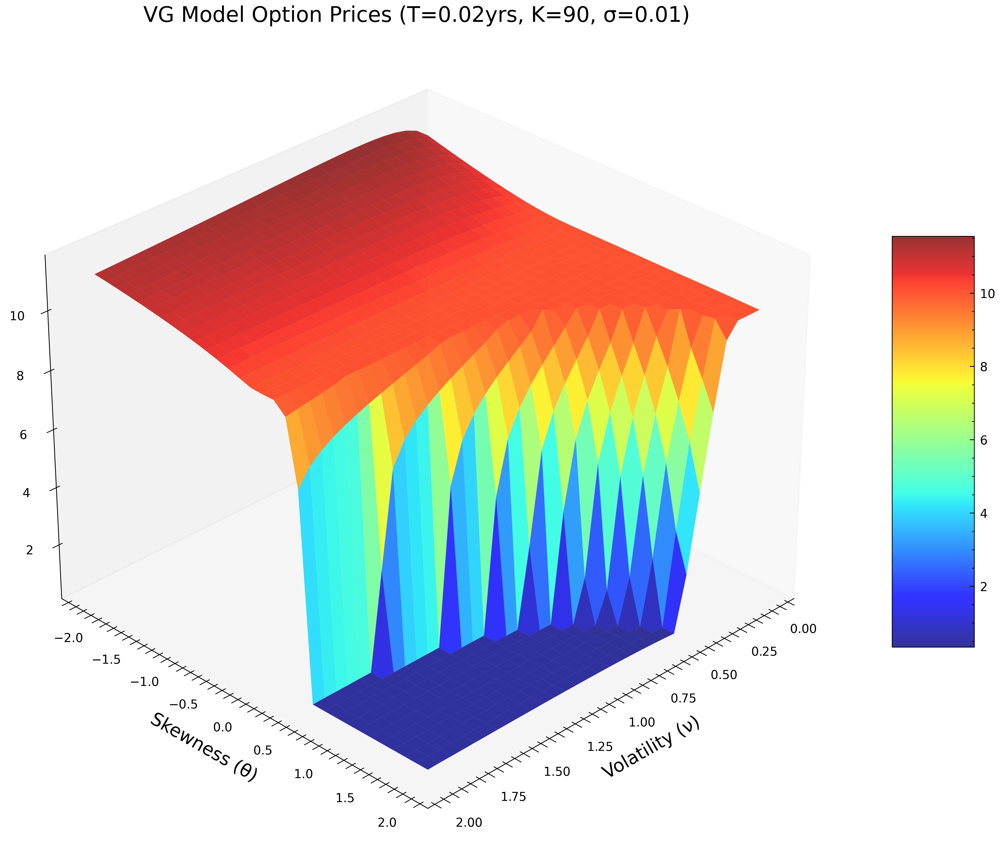

In [ ]:
# 仿照Itkin的三维波动率/偏度曲面图 核心区域稳定收敛
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'  # 使用支持数学符号的字体
plt.rcParams['mathtext.fontset'] = 'stix'    # 专门显示数学符号的字体集
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata

def phiVG2_func(mu, r, T, alpha, sigma, nu, theta):
    """VG模型特征函数计算（修正版）"""
    adjusted_mu = mu - (alpha + 1) * 1j  # 关键修正：调整自变量
    log_arg = 1 - nu * theta - sigma**2 * nu / 2
    log_arg = max(log_arg, 1e-10)  # 数值稳定性处理
    
    PphiVG = np.exp(
        1j * T * r * adjusted_mu +
        1j * T / nu * np.log(log_arg) * adjusted_mu -
        T * np.log(1 - 1j * theta * nu * adjusted_mu + sigma**2 * nu * adjusted_mu**2 / 2) / nu
    )
    return np.exp(-r * T) * PphiVG / (alpha**2 + alpha - mu**2 + 1j * (2 * alpha + 1) * mu)

def compute_option_price(S0, K, r, T, sigma, nu, theta, alpha=0.75, N=1024):
    """计算单个期权的VG模型价格"""
    ita = 0.25
    u = ita * (np.arange(1, N + 1) - 1)
    phi_values = phiVG2_func(u, r, T, alpha, sigma, nu, theta)
    x = np.exp(1j * (np.pi / ita) * u) * phi_values * ita
    x[0] /= 2
    
    fft_pri = np.fft.fft(x)
    z = np.real(fft_pri)

    kv = -(np.pi / ita) + ((2 * np.pi) / (N * ita)) * (np.arange(1, N + 1) - 1)
    C = S0 * (1 / np.pi * np.exp(-alpha * kv)) * z
    ex_k = np.exp(kv) * S0
    
    # 插值获取指定执行价的价格
    valid_mask = (ex_k >= 0.5*K) & (ex_k <= 2*K)
    if sum(valid_mask) > 10:
        f = interp1d(ex_k[valid_mask], C[valid_mask], kind='linear')
        return float(f(K))
    return np.nan

def plot_3d_surface():
    # 固定参数（根据图片中的参数设置）
    S0 = 100      # 标的现价
    K = 90        # 执行价（与图片一致）
    r = 0.02      # 无风险利率
    T = 0.02      # 到期时间（与图片一致0.02年）
    alpha = 0.75  # 阻尼因子（用户建议）
    
    # 创建参数网格（与图片范围一致）
    theta_values = np.linspace(-2, 2, 30)    # 偏度参数（纵轴）
    nu_values = np.linspace(0.1, 2, 30)       # 波动率参数（横轴）
    sigma = 0.01                             # 基础波动率（与图片一致）
    
    # 计算曲面数据
    option_prices = np.zeros((len(theta_values), len(nu_values)))
    for i, theta in enumerate(theta_values):
        for j, nu in enumerate(nu_values):
            option_prices[i,j] = compute_option_price(
                S0=S0, K=K, r=r, T=T, 
                sigma=sigma, nu=nu, theta=theta, alpha=alpha
            )
    
    # 创建网格数据
    Theta, Nu = np.meshgrid(theta_values, nu_values)
    
    # 绘制3D曲面
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # 使用红-黄-蓝渐变色彩（与图片一致）
    surf = ax.plot_surface(Nu, Theta, option_prices.T, 
                          cmap='jet',  # 使用jet色图获得红黄蓝渐变
                          edgecolor='none', 
                          alpha=0.8)
    
    # 设置坐标轴标签（与图片一致）
    ax.set_xlabel('Volatility (ν)', fontsize=12)
    ax.set_ylabel('Skewness (θ)', fontsize=12)
    ax.set_zlabel('Option Price', fontsize=12)
    ax.set_title(f'VG Model Option Prices (T={T}yrs, K={K}, σ={sigma})', fontsize=14)
    
    # 调整视角（与图片类似的角度）
    ax.view_init(elev=30, azim=45)
    
    # 添加颜色条
    fig.colorbar(surf, shrink=0.5, aspect=5)
    
    plt.tight_layout()
    plt.savefig('VG_option_surface.png', dpi=300)
    plt.show()

if __name__ == "__main__":
    plot_3d_surface()
'''
carr-madan法在skewness处于0.5-2.0 volatility处于0.5-2.0区域内是平面, 为价格对参数变化不敏感，梯度近乎为零 而lewsi法仍然是光滑的
这说明 carr法 α选择不当导致高频信息丢失 而lewis法在该区域仍然能捕捉到价格变化无需人工阻尼，保留完整频谱
'''

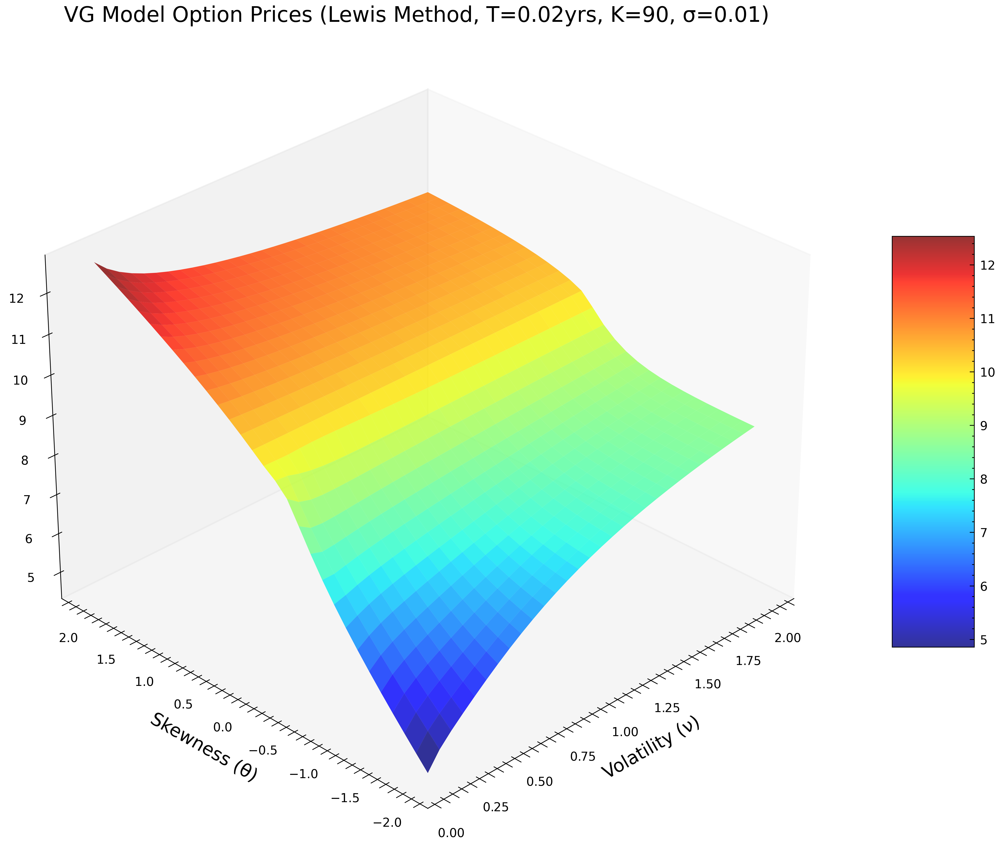

In [13]:
# Lewis法画三维波动率/偏度曲面图
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['mathtext.fontset'] = 'stix'
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import interp1d
from scipy.fft import ifft

def phiVG_Lewis(u, r, T, sigma, nu, theta):
    """VG模型的特征函数（Lewis方法专用形式）"""
    z = -u - 0.5j  # Lewis方法的复数偏移
    arg = 1 - nu * theta * z - 0.5 * sigma**2 * nu * z**2
    arg = np.maximum(np.real(arg), 1e-10) + 1j * np.imag(arg)  # 避免对数域错误
    log_term = np.log(arg)
    return np.exp(1j * T * r * z + (1j * T / nu) * log_term)

def lewis_option_price(S0, K, r, T, sigma, nu, theta, N=2**12, B=200):
    """Lewis方法的FFT实现计算单个期权价格"""
    # 离散化参数
    dx = B / N
    x = np.arange(N) * dx  # 积分网格
    
    # 辛普森权重
    weight = np.ones(N)
    weight[1:N:2] = 4  # 奇数索引为4
    weight[2:N-1:2] = 2  # 偶数索引为2
    
    # FFT参数
    dk = 2 * np.pi / B
    b = N * dk / 2
    ks = -b + dk * np.arange(N)  # 对数执行价格网格
    
    # 构造被积函数
    cf = lambda u: phiVG_Lewis(u, r, T, sigma, nu, theta)
    integrand = np.exp(-1j * b * x) * cf(x) * 1/(x**2 + 0.25) * weight * dx/3
    
    # FFT计算
    integral_value = np.real(ifft(integrand) * N)
    
    # 插值计算指定执行价的价格
    log_moneyness = np.log(S0 / K)
    spline = interp1d(ks, integral_value, kind='linear', fill_value="extrapolate")
    
    # Lewis公式
    price = S0 - np.sqrt(S0 * K) * np.exp(-r * T)/np.pi * spline(log_moneyness)
    return price

def plot_3d_surface():
    # 固定参数（保持与原代码一致）
    S0 = 100      # 标的现价
    K = 90        # 执行价
    r = 0.02      # 无风险利率
    T = 0.02      # 到期时间
    sigma = 0.01   # 基础波动率
    
    # 创建参数网格（与图片范围一致）
    theta_values = np.linspace(-2, 2, 30)    # 偏度参数（纵轴）
    nu_values = np.linspace(0.1, 2, 30)      # 波动率参数（横轴）
    
    # 计算曲面数据（使用Lewis方法）
    option_prices = np.zeros((len(theta_values), len(nu_values)))
    for i, theta in enumerate(theta_values):
        for j, nu in enumerate(nu_values):
            option_prices[i,j] = lewis_option_price(
                S0=S0, K=K, r=r, T=T, 
                sigma=sigma, nu=nu, theta=theta
            )
    
    # 创建网格数据
    Theta, Nu = np.meshgrid(theta_values, nu_values)
    
    # 绘制3D曲面
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # 使用红-黄-蓝渐变色彩
    surf = ax.plot_surface(Nu, Theta, option_prices.T, 
                          cmap='jet',
                          edgecolor='none', 
                          alpha=0.8)
    
    # 设置坐标轴标签
    ax.set_xlabel('Volatility (ν)', fontsize=12)
    ax.set_ylabel('Skewness (θ)', fontsize=12)
    ax.set_zlabel('Option Price', fontsize=12)
    ax.set_title(f'VG Model Option Prices (Lewis Method, T={T}yrs, K={K}, σ={sigma})', fontsize=14)
    
    # 调整视角
    ax.view_init(elev=30, azim=45+180)
    
    # 添加颜色条
    fig.colorbar(surf, shrink=0.5, aspect=5)
    
    plt.tight_layout()
    plt.savefig('VG_option_surface_lewis.png', dpi=300)
    plt.show()

if __name__ == "__main__":
    plot_3d_surface()


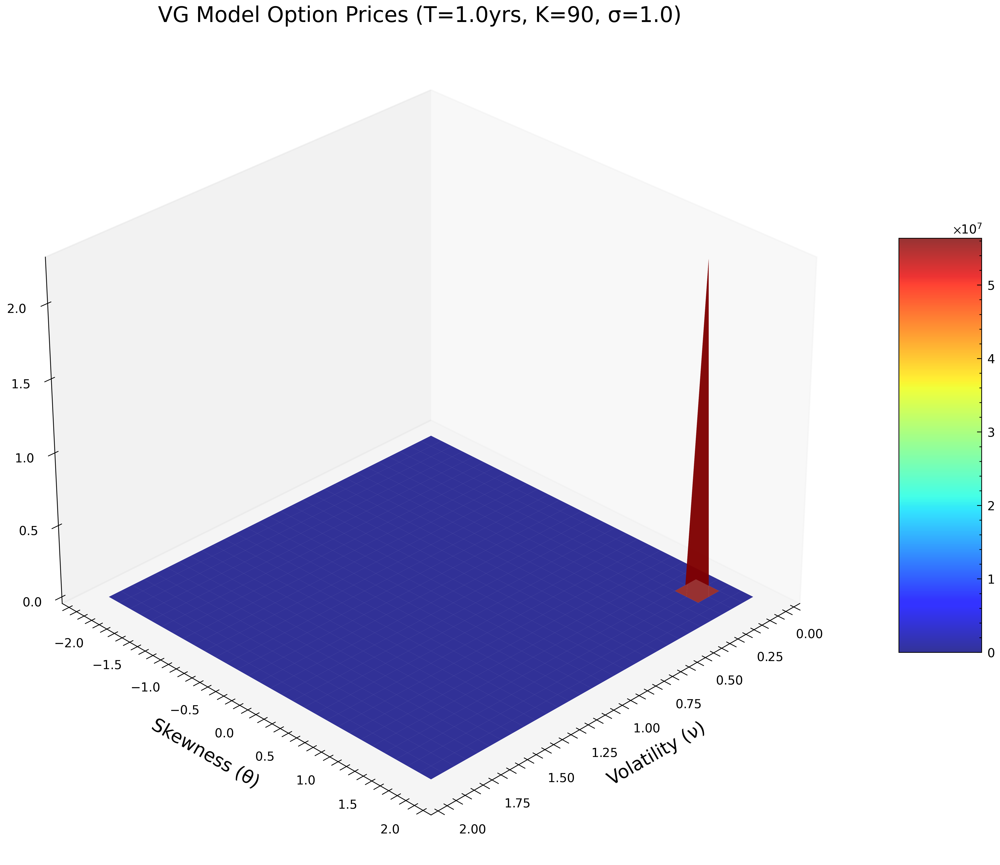

In [ ]:
# 仿照Itkin的三维波动率/偏度曲面图 特征函数衰减缓慢 积分爆炸
# alpha=0.75 

import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'  # 使用支持数学符号的字体
plt.rcParams['mathtext.fontset'] = 'stix'    # 专门显示数学符号的字体集
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata

def phiVG2_func(mu, r, T, alpha, sigma, nu, theta):
    """VG模型特征函数计算（修正版）"""
    adjusted_mu = mu - (alpha + 1) * 1j  # 关键修正：调整自变量
    log_arg = 1 - nu * theta - sigma**2 * nu / 2
    log_arg = max(log_arg, 1e-10)  # 数值稳定性处理
    
    PphiVG = np.exp(
        1j * T * r * adjusted_mu +
        1j * T / nu * np.log(log_arg) * adjusted_mu -
        T * np.log(1 - 1j * theta * nu * adjusted_mu + sigma**2 * nu * adjusted_mu**2 / 2) / nu
    )
    return np.exp(-r * T) * PphiVG / (alpha**2 + alpha - mu**2 + 1j * (2 * alpha + 1) * mu)

def compute_option_price(S0, K, r, T, sigma, nu, theta, alpha=0.75, N=1024):
    """计算单个期权的VG模型价格"""
    ita = 0.25
    u = ita * (np.arange(1, N + 1) - 1)
    phi_values = phiVG2_func(u, r, T, alpha, sigma, nu, theta)
    x = np.exp(1j * (np.pi / ita) * u) * phi_values * ita
    x[0] /= 2
    
    fft_pri = np.fft.fft(x)
    z = np.real(fft_pri)

    kv = -(np.pi / ita) + ((2 * np.pi) / (N * ita)) * (np.arange(1, N + 1) - 1)
    C = S0 * (1 / np.pi * np.exp(-alpha * kv)) * z
    ex_k = np.exp(kv) * S0
    
    # 插值获取指定执行价的价格
    valid_mask = (ex_k >= 0.5*K) & (ex_k <= 2*K)
    if sum(valid_mask) > 10:
        f = interp1d(ex_k[valid_mask], C[valid_mask], kind='linear')
        return float(f(K))
    return np.nan

def plot_3d_surface():
    # 固定参数（根据图片中的参数设置）
    S0 = 100      # 标的现价
    K = 90        # 执行价（与图片一致）
    r = 0.02      # 无风险利率
    T = 1.00      # 到期时间（与图片一致0.02年）
    alpha = 0.75  # 阻尼因子（用户建议）
    
    # 创建参数网格（与图片范围一致）
    theta_values = np.linspace(-2, 2, 30)    # 偏度参数（纵轴）
    nu_values = np.linspace(0.1, 2, 30)       # 波动率参数（横轴）
    sigma = 1.0                             # 基础波动率（与图片一致）
    
    # 计算曲面数据
    option_prices = np.zeros((len(theta_values), len(nu_values)))
    for i, theta in enumerate(theta_values):
        for j, nu in enumerate(nu_values):
            option_prices[i,j] = compute_option_price(
                S0=S0, K=K, r=r, T=T, 
                sigma=sigma, nu=nu, theta=theta, alpha=alpha
            )
    
    # 创建网格数据
    Theta, Nu = np.meshgrid(theta_values, nu_values)
    
    # 绘制3D曲面
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # 使用红-黄-蓝渐变色彩（与图片一致）
    surf = ax.plot_surface(Nu, Theta, option_prices.T, 
                          cmap='jet',  # 使用jet色图获得红黄蓝渐变
                          edgecolor='none', 
                          alpha=0.8)
    
    # 设置坐标轴标签（与图片一致）
    ax.set_xlabel('Volatility (ν)', fontsize=12)
    ax.set_ylabel('Skewness (θ)', fontsize=12)
    ax.set_zlabel('Option Price', fontsize=12)
    ax.set_title(f'VG Model Option Prices (T={T}yrs, K={K}, σ={sigma})', fontsize=14)
    
    # 调整视角（与图片类似的角度）
    ax.view_init(elev=30, azim=45)
    
    # 添加颜色条
    fig.colorbar(surf, shrink=0.5, aspect=5)
    
    plt.tight_layout()
    plt.savefig('VG_option_surface.png', dpi=300)
    plt.show()

if __name__ == "__main__":
    plot_3d_surface()

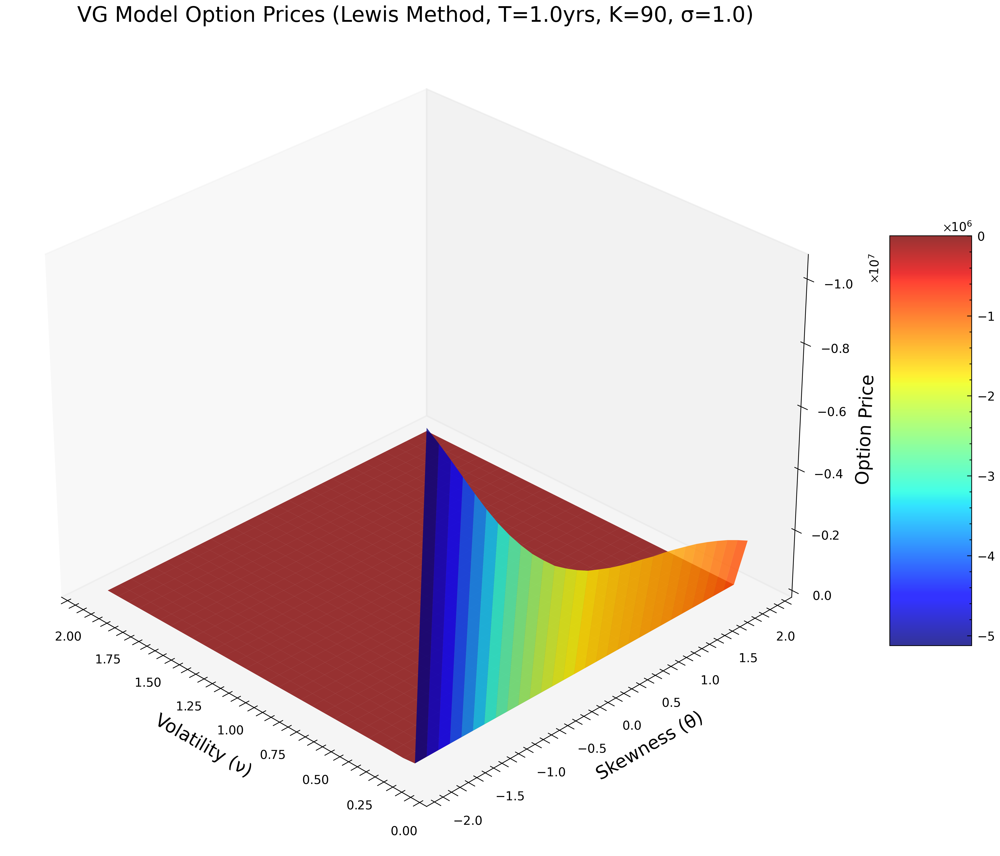

In [15]:
# Lewis法画三维波动率/偏度曲面图 改变T sigma 
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['mathtext.fontset'] = 'stix'
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import interp1d
from scipy.fft import ifft

def phiVG_Lewis(u, r, T, sigma, nu, theta):
    """VG模型的特征函数（Lewis方法专用形式）"""
    z = -u - 0.5j  # Lewis方法的复数偏移
    arg = 1 - nu * theta * z - 0.5 * sigma**2 * nu * z**2
    arg = np.maximum(np.real(arg), 1e-10) + 1j * np.imag(arg)  # 避免对数域错误
    log_term = np.log(arg)
    return np.exp(1j * T * r * z + (1j * T / nu) * log_term)

def lewis_option_price(S0, K, r, T, sigma, nu, theta, N=2**12, B=200):
    """Lewis方法的FFT实现计算单个期权价格"""
    # 离散化参数
    dx = B / N
    x = np.arange(N) * dx  # 积分网格
    
    # 辛普森权重
    weight = np.ones(N)
    weight[1:N:2] = 4  # 奇数索引为4
    weight[2:N-1:2] = 2  # 偶数索引为2
    
    # FFT参数
    dk = 2 * np.pi / B
    b = N * dk / 2
    ks = -b + dk * np.arange(N)  # 对数执行价格网格
    
    # 构造被积函数
    cf = lambda u: phiVG_Lewis(u, r, T, sigma, nu, theta)
    integrand = np.exp(-1j * b * x) * cf(x) * 1/(x**2 + 0.25) * weight * dx/3
    
    # FFT计算
    integral_value = np.real(ifft(integrand) * N)
    
    # 插值计算指定执行价的价格
    log_moneyness = np.log(S0 / K)
    spline = interp1d(ks, integral_value, kind='linear', fill_value="extrapolate")
    
    # Lewis公式
    price = S0 - np.sqrt(S0 * K) * np.exp(-r * T)/np.pi * spline(log_moneyness)
    return price

def plot_3d_surface():
    # 固定参数（保持与原代码一致）
    S0 = 100      # 标的现价
    K = 90        # 执行价
    r = 0.02      # 无风险利率
    T = 1.0      # 到期时间
    sigma = 1.0   # 基础波动率
    
    # 创建参数网格（与图片范围一致）
    theta_values = np.linspace(-2, 2, 30)    # 偏度参数（纵轴）
    nu_values = np.linspace(0.1, 2, 30)      # 波动率参数（横轴）
    
    # 计算曲面数据（使用Lewis方法）
    option_prices = np.zeros((len(theta_values), len(nu_values)))
    for i, theta in enumerate(theta_values):
        for j, nu in enumerate(nu_values):
            option_prices[i,j] = lewis_option_price(
                S0=S0, K=K, r=r, T=T, 
                sigma=sigma, nu=nu, theta=theta
            )
    
    # 创建网格数据
    Theta, Nu = np.meshgrid(theta_values, nu_values)
    
    # 绘制3D曲面
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # 使用红-黄-蓝渐变色彩
    surf = ax.plot_surface(Nu, Theta, option_prices.T, 
                          cmap='jet',
                          edgecolor='none', 
                          alpha=0.8)
    
    # 设置坐标轴标签
    ax.set_xlabel('Volatility (ν)', fontsize=12)
    ax.set_ylabel('Skewness (θ)', fontsize=12)
    ax.set_zlabel('Option Price', fontsize=12)
    ax.set_title(f'VG Model Option Prices (Lewis Method, T={T}yrs, K={K}, σ={sigma})', fontsize=14)
    
    # 调整视角
    ax.view_init(elev=30+180, azim=45)
    
    # 添加颜色条
    fig.colorbar(surf, shrink=0.5, aspect=5)
    
    plt.tight_layout()
    plt.savefig('VG_option_surface_lewis.png', dpi=300)
    plt.show()

if __name__ == "__main__":
    plot_3d_surface()


### 3D图现象分析2
lewis 法ν=0.25时全θ范围有响应
madan法	仅在θ≈1.5且ν≈0.25时出现尖峰 产生虚假的极端值定价


C:\Users\86166\AppData\Local\Temp\ipykernel_31096\3581472861.py:10: RuntimeWarning: divide by zero encountered in divide
  d1 = (np.log(S0 / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))


BS计算时间: 0.0033秒
BS计算时间: 0.0011秒
BS计算时间: 0.0000秒
BS计算时间: 0.0011秒
BS计算时间: 0.0000秒
BS计算时间: 0.0015秒
BS计算时间: 0.0000秒
BS计算时间: 0.0010秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0010秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0011秒
BS计算时间: 0.0000秒
BS计算时间: 0.0010秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0010秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0015秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0013秒
BS计算时间: 0.0000秒
BS计算时间: 0.0010秒
BS计算时间: 0.0010秒
BS计算时间: 0.0010秒
BS计算时间: 0.0010秒
BS计算时间: 0.0000秒
BS计算时间: 0.0010秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0015秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0010秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0010秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0010秒
BS计算时间: 0.0010秒
BS计算时间: 0.0012秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0010秒
BS计算时间: 0.0010秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 0.0000秒
BS计算时间: 

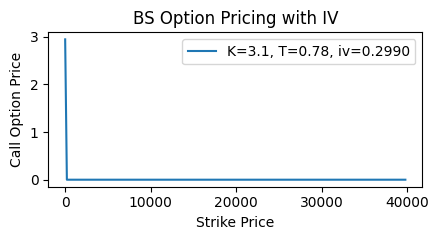

In [ ]:
# 使用BS公式计算期权价格
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
import datetime
import pandas as pd
from scipy.stats import norm

# Black-Scholes 定价公式
def black_scholes_price(S0, K, r, T, sigma):
    d1 = (np.log(S0 / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    call_price = S0 * norm.cdf(d1) - K * np.exp(-r * T) * norm.cdf(d2)
    put_price = K * np.exp(-r * T) * norm.cdf(-d2) - S0 * norm.cdf(-d1)
    return call_price, put_price

# 使用 BS 模型计算期权价格（添加sigma参数）
def bs_option_pricing(S0, r, T, sigma):
    tstart = datetime.datetime.now()

    K = np.arange(0, 40001, 200)  # 执行价格范围
    Call, Put = black_scholes_price(S0, K, r, T, sigma)  # 使用传入的sigma

    Ttime = datetime.datetime.now() - tstart
    print(f"BS计算时间: {Ttime.total_seconds():.4f}秒")

    return K, Call

# 主函数
def main():
    # 读取数据
    df = pd.read_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\test_data_BS.csv')
    
    # 检查数据列
    required_columns = ['spotPrice', 'RFR', 'strikePrice', 'dayToExpire', 'iv', 'optID']
    if not all(col in df.columns for col in required_columns):
        missing = [col for col in required_columns if col not in df.columns]
        raise ValueError(f"CSV文件中缺少必要的列: {missing}")
    
    # 获取参数数据
    S0 = df['spotPrice'].iloc[0]
    r = df['RFR'].iloc[0]
    K_all = df['strikePrice'].values
    T_all = df['dayToExpire'].values
    sigma_all = df['iv'].values
    
    # 为每个期权计算BS价格
    all_theory_prices = []
    computation_times = []
    last_valid = None  # 记录最后一个有效计算结果用于绘图
    
    for i in range(len(df)):
        strike = K_all[i]
        expiry = T_all[i]
        sigma = sigma_all[i]  # 使用当前期权的iv值
        
        # 运行BS定价（传入当前期权的sigma）
        t_start = datetime.datetime.now()
        try:
            K_range, Call_prices = bs_option_pricing(S0=S0, r=r, T=expiry, sigma=sigma)
            last_valid = (K_range, Call_prices, strike, expiry, sigma)  # 保存最后一个有效结果
        except Exception as e:
            print(f"计算期权{df['optID'].iloc[i]}时出错: {str(e)}")
            all_theory_prices.append(np.nan)
            computation_times.append(np.nan)
            continue
        
        t_end = datetime.datetime.now()
        
        # 记录计算时间
        comp_time = (t_end - t_start).total_seconds()
        computation_times.append(comp_time)
        
        # 插值获取该执行价格对应的期权价格
        f = interp1d(K_range, Call_prices, kind='cubic', fill_value='extrapolate')
        theory_price = f(strike)
        all_theory_prices.append(theory_price)
        
        # 价格合理性检查
        if theory_price < 0 or theory_price > S0 * 1.5:  # 简单合理性检查
            print(f"警告: 异常价格 {theory_price:.2f} @ K={strike}, iv={sigma:.4f}")
    
    # 打印总计算时间统计
    print(f"\n计算统计:")
    print(f"总期权数量: {len(df)}")
    print(f"成功计算: {len([x for x in all_theory_prices if not np.isnan(x)])}")
    print(f"总计算时间: {sum(t for t in computation_times if not np.isnan(t)):.4f}秒")
    print(f"平均计算时间: {np.nanmean(computation_times):.4f}秒")
    
    # 创建结果DataFrame
    output_df = pd.DataFrame({
        'optionID': df['optID'],
        'strikePrice': K_all,
        'dayToExpire': T_all,
        'iv': sigma_all,
        'theoryPriceBS': all_theory_prices,
        'computationTime': computation_times
    })
    
    # 保存到CSV
    output_df.to_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\test_data_BS_output.csv', index=False)
    print("\nBS价格已保存到 test_data_BS_output.csv")

    # 绘制最后一个有效期权的定价曲线
    if last_valid is not None:
        K_range, Call_prices, strike, expiry, sigma = last_valid
        plt.figure(figsize=(4.5, 2.5))
        plt.plot(K_range[:200], Call_prices[:200], 
                label=f'K={strike}, T={expiry:.2f}, iv={sigma:.4f}')
        plt.xlabel('Strike Price')
        plt.ylabel('Call Option Price')
        plt.title('BS Option Pricing with IV')
        plt.legend()
        plt.tight_layout()
        plt.show()

if __name__ == "__main__":
    main()

C:\Users\86166\AppData\Local\Temp\ipykernel_34028\3715714388.py:5: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(r'E:\pyProjects\3DTensor-basedDL4OptionPricing\data_ipynb\test_data.csv')


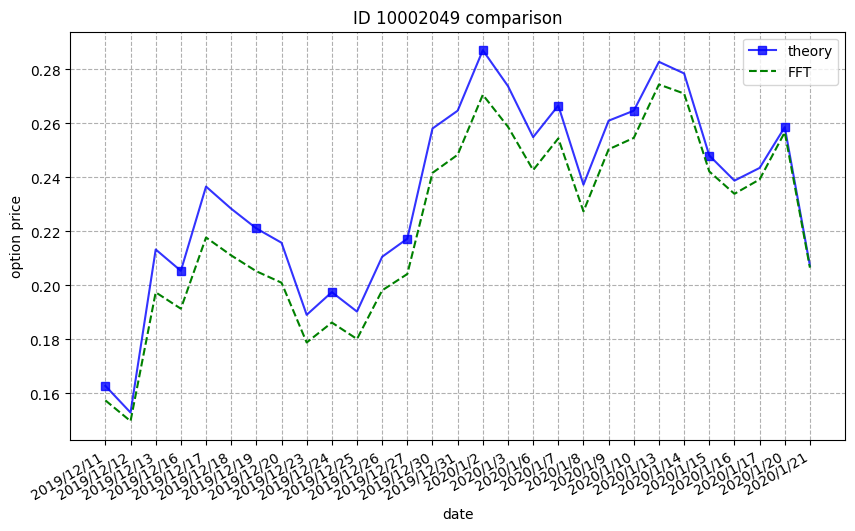

In [ ]:
# 绘制FFT计算与BS计算的对比图
# alpha=0.75拟合效果最好
import pandas as pd
import matplotlib.pyplot as plt

# 读取CSV文件
df1 = pd.read_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\test_data.csv')
df2 = pd.read_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\fft_results(alpha=2.5).csv')

# 提取ID为10002049的数据
option1 = df1[df1['optID'] == 10002049]
option2 = df2[df2['optID'] == 10002049]

# 检查是否找到数据
if option1.empty or option2.empty:
    print("未找到ID为10002049的期权数据")
else:
    # 绘制曲线图
    plt.figure(figsize=(10, 6))
    
    # 绘制原始数据
    plt.plot(option1['tradeDate'], option1['theoryPrice'], label='theory', color='blue', \
        linestyle='-', \
        marker='s', \
        markevery=3, \
        alpha=.8 # 透明度 
        )
    
    # 绘制FFT处理后的数据
    plt.plot(option1['tradeDate'], option2['theoryPrice'], label='FFT-Carr-Madan', color='green', linestyle='--')
    
    # 添加图表元素
    plt.title('ID 10002049 comparison')
    plt.xlabel('date')
    plt.ylabel('option price')
    plt.legend()
    plt.grid(True, linestyle='--')
    
    # 自动调整日期标签
    plt.gcf().autofmt_xdate()
    
    # 显示图表
    plt.show()

C:\Users\86166\AppData\Local\Temp\ipykernel_28352\840739550.py:10: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(r'E:\pyProjects\3DTensor-basedDL4OptionPricing\data_ipynb\test_data.csv')
C:\Users\86166\AppData\Local\Temp\ipykernel_28352\840739550.py:11: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df2 = pd.read_csv(r'E:\pyProjects\3DTensor-basedDL4OptionPricing\data_ipynb\test_data(alpha=.75).csv')


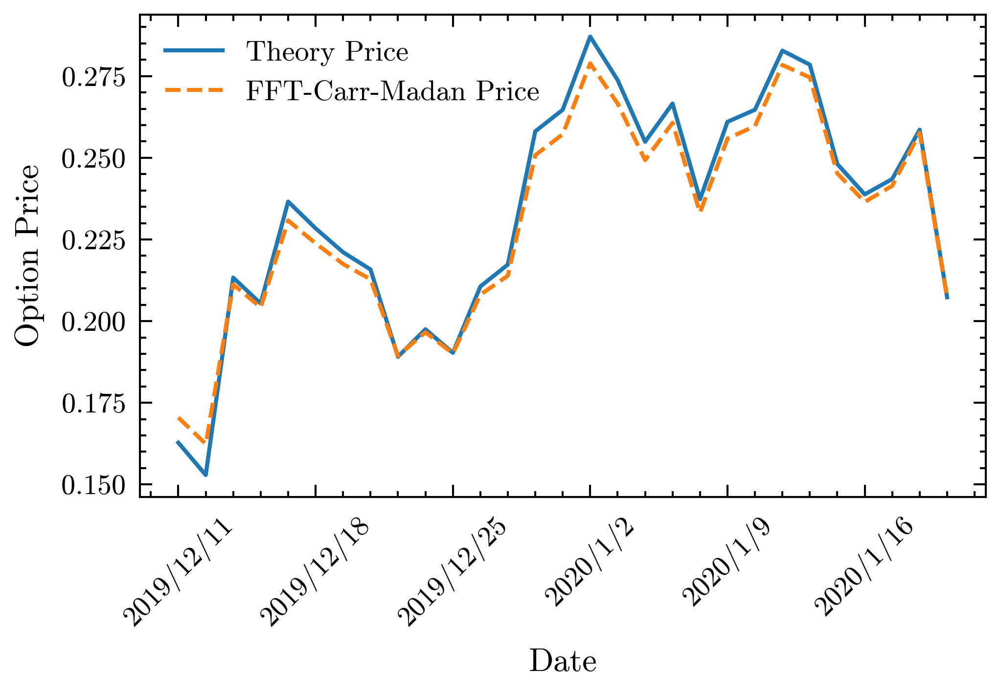

In [ ]:
# 绘制FFT计算与BS计算的对比图
# alpha=0.75拟合效果最好
# IEEE格式
import pandas as pd
import matplotlib.pyplot as plt
from scienceplots import styles
from matplotlib.ticker import MultipleLocator  # 导入刻度定位器

# 读取CSV文件
df1 = pd.read_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\test_data.csv')
df2 = pd.read_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\test_data(alpha=.75).csv')

# 提取ID为10002049的数据
option1 = df1[df1['optID'] == 10002049]
option2 = df2[df2['optID'] == 10002049]

if option1.empty or option2.empty:
    print("未找到ID为10002049的期权数据")
else:
    # 启用IEEE样式
    plt.style.use(["science", "ieee", "no-latex"])
    plt.rcParams['grid.linewidth'] = 0
    
    # 创建图形
    plt.figure(figsize=(3.5, 2.5))
    
    # 绘制数据
    plt.plot(option1['tradeDate'], option1['theoryPrice'], 
             color='#1f77b4', linewidth=1, label='Theory Price')
    plt.plot(option1['tradeDate'], option2['theoryPrice'],
             color='#ff7f0e', linestyle='--', linewidth=1, label='FFT-Carr-Madan Price')
    
    # 获取当前坐标轴
    ax = plt.gca()
    
    # 设置x轴刻度：每隔5个数据显示一个标签
    ax.xaxis.set_major_locator(MultipleLocator(5))  # 关键修改点
    
    # 旋转日期标签避免重叠
    plt.xticks(rotation=45, fontsize=7)
    plt.yticks(fontsize=7)
    
    # 添加标签和图例
    plt.xlabel('Date', fontsize=8)
    plt.ylabel('Option Price', fontsize=8)
    plt.legend(fontsize=7, frameon=False)
    
    # 紧凑布局并保存
    plt.tight_layout()
    plt.savefig("option_price_comparison.pdf", bbox_inches='tight', dpi=300)
    plt.show()

In [ ]:
# 修改Phi函数，绘制对比图---失败
import pandas as pd
import matplotlib.pyplot as plt
from scienceplots import styles
from matplotlib.ticker import MultipleLocator  # 导入刻度定位器

# 读取CSV文件
df1 = pd.read_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\test_data.csv')
df2 = pd.read_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\fft_results(alpha=0.75(调整PhiVG)).csv')

# 提取ID为10002049的数据
option1 = df1[df1['optID'] == 10002049]
option2 = df2[df2['optID'] == 10002049]

if option1.empty or option2.empty:
    print("未找到ID为10002049的期权数据")
else:
    # 启用IEEE样式
    plt.style.use(["science", "ieee", "no-latex"])
    plt.rcParams['grid.linewidth'] = 0
    
    # 创建图形
    plt.figure(figsize=(3.5, 2.5))
    
    # 绘制数据
    plt.plot(option1['tradeDate'], option1['theoryPrice'], 
             color='#1f77b4', linewidth=1, label='Theory Price')
    plt.plot(option1['tradeDate'], option2['theoryPrice'],
             color='#ff7f0e', linestyle='--', linewidth=1, label='FFT Price')
    
    # 获取当前坐标轴
    ax = plt.gca()
    
    # 设置x轴刻度：每隔5个数据显示一个标签
    ax.xaxis.set_major_locator(MultipleLocator(5))  # 关键修改点
    
    # 旋转日期标签避免重叠
    plt.xticks(rotation=45, fontsize=7)
    plt.yticks(fontsize=7)
    
    # 添加标签和图例
    plt.xlabel('Date', fontsize=8)
    plt.ylabel('Option Price', fontsize=8)
    plt.legend(fontsize=7, frameon=False)
    
    # 紧凑布局并保存
    plt.tight_layout()
    plt.savefig("option_price_comparison.pdf", bbox_inches='tight', dpi=300)
    plt.show()

In [ ]:
# Lewis-FFT方法计算VG模型期权价格
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
from scipy.fft import ifft
import datetime

def phiVG_Lewis(u, r, T, sigma, nu, theta):
    """VG模型的特征函数（Lewis方法专用形式）"""
    z = -u - 0.5j  # Lewis方法的复数偏移
    arg = 1 - nu * theta * z - 0.5 * sigma**2 * nu * z**2
    arg = np.maximum(np.real(arg), 1e-10) + 1j * np.imag(arg)  # 避免对数域错误
    log_term = np.log(arg)
    return np.exp(1j * T * r * z + (1j * T / nu) * log_term)

def fft_Lewis(K, S0, r, T, cf, interp="linear"):
    """
    Lewis方法的FFT实现
    K: 执行价格向量
    S0: 标的资产现价
    r: 无风险利率
    T: 到期时间
    cf: 特征函数
    interp: 插值方法（linear或cubic）
    """
    N = 2**12  # FFT点数（2的幂次效率更高）
    B = 200    # 积分上限
    dx = B / N
    x = np.arange(N) * dx  # 积分网格
    
    # 辛普森权重（修正后的写法）
    weight = np.ones(N)
    weight[1:N:2] = 4  # 奇数索引为4
    weight[2:N-1:2] = 2  # 偶数索引为2
    
    # FFT参数
    dk = 2 * np.pi / B
    b = N * dk / 2
    ks = -b + dk * np.arange(N)  # 对数执行价格网格
    
    # 构造被积函数
    integrand = np.exp(-1j * b * x) * cf(x - 0.5j) * 1/(x**2 + 0.25) * weight * dx/3
    
    # FFT计算
    integral_value = np.real(ifft(integrand) * N)
    
    # 插值计算期权价格
    log_moneyness = np.log(S0 / K)
    spline = interp1d(ks, integral_value, kind=interp, fill_value="extrapolate")
    
    # Lewis公式
    prices = S0 - np.sqrt(S0 * K) * np.exp(-r * T)/np.pi * spline(log_moneyness)
    return prices

def main():
    # 数据读取
    df = pd.read_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\test_data_BS.csv')
    df_params = pd.read_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\test_data.csv')
    
    # 数据对齐检查
    if len(df) != len(df_params):
        min_len = min(len(df), len(df_params))
        df = df.iloc[:min_len]
        df_params = df_params.iloc[:min_len]
        print(f"警告：数据行数不一致，已截取前{min_len}行")
    
    # 初始化统计
    total_time = 0.0
    results = []
    
    for i in range(len(df)):
        try:
            # 获取参数
            strike = float(df['strikePrice'].iloc[i])
            expiry = float(df['dayToExpire'].iloc[i]) / 365.0  # 年化
            S0 = float(df['spotPrice'].iloc[i])
            r = float(df['RFR'].iloc[i])
            theta = float(df_params['theta'].iloc[i])
            
            # 定义特征函数（VG模型）
            def cf(u):
                return phiVG_Lewis(u, r, expiry, sigma=0.2, nu=0.1, theta=theta)
            
            # 计算单个期权价格
            tstart = datetime.datetime.now()
            price = fft_Lewis(np.array([strike]), S0, r, expiry, cf, interp="linear")[0]
            elapsed_time = (datetime.datetime.now() - tstart).total_seconds()
            
            # 记录结果
            results.append({
                'optID': df['optID'].iloc[i],
                'strike': strike,
                'theoryPrice': price,
                'computeTime': elapsed_time
            })
            total_time += elapsed_time
            
        except Exception as e:
            print(f"第{i+1}行处理失败: {str(e)}")
            results.append({
                'optID': df['optID'].iloc[i],
                'error': str(e)
            })
    
    # 保存结果
    result_df = pd.DataFrame(results)
    result_df.to_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\lewis_fft_results.csv', index=False)
    
    # 输出统计
    print("\n计算统计:")
    print(f"总期权数量: {len(df)}")
    print(f"总计算时间: {total_time:.2f}秒")
    print(f"平均每期权时间: {total_time/len(df):.4f}秒")

if __name__ == "__main__":
    main()

C:\Users\86166\AppData\Local\Temp\ipykernel_28352\268832939.py:57: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df_params = pd.read_csv(r'E:\pyProjects\3DTensor-basedDL4OptionPricing\data_ipynb\test_data.csv')


警告：数据行数不一致，已截取前13438行

计算统计:
总期权数量: 13438
总计算时间: 7.41秒
平均每期权时间: 0.0006秒


C:\Users\86166\AppData\Local\Temp\ipykernel_28352\1754650189.py:10: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(r'E:\pyProjects\3DTensor-basedDL4OptionPricing\data_ipynb\test_data.csv')


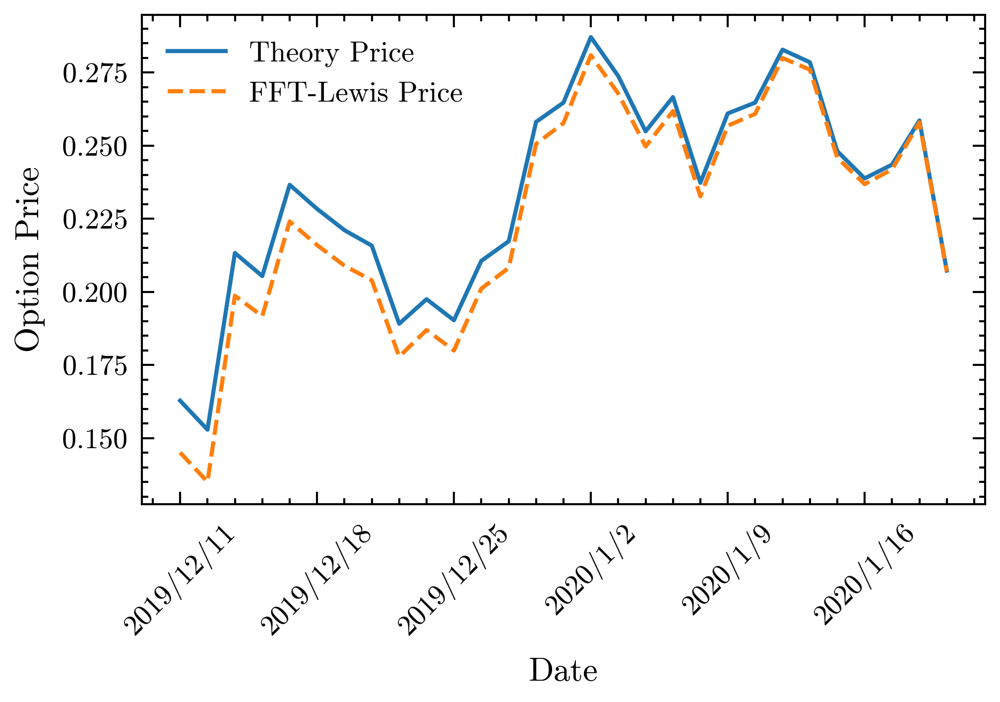

In [ ]:
# 绘制实际结果与Lewis计算的对比图
# alpha=0.75拟合效果最好
# IEEE格式
import pandas as pd
import matplotlib.pyplot as plt
from scienceplots import styles
from matplotlib.ticker import MultipleLocator  # 导入刻度定位器

# 读取CSV文件
df1 = pd.read_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\test_data.csv')
df2 = pd.read_csv(r'.\3DTensor-basedDL4OptionPricing\data_ipynb\lewis_fft_results.csv')

# 提取ID为10002049的数据
option1 = df1[df1['optID'] == 10002049]
option2 = df2[df2['optID'] == 10002049]

if option1.empty or option2.empty:
    print("未找到ID为10002049的期权数据")
else:
    # 启用IEEE样式
    plt.style.use(["science", "ieee", "no-latex"])
    plt.rcParams['grid.linewidth'] = 0
    
    # 创建图形
    plt.figure(figsize=(3.5, 2.5))
    
    # 绘制数据
    plt.plot(option1['tradeDate'], option1['theoryPrice'], 
             color='#1f77b4', linewidth=1, label='Theory Price')
    plt.plot(option1['tradeDate'], option2['theoryPrice'],
             color='#ff7f0e', linestyle='--', linewidth=1, label='FFT-Lewis Price')
    
    # 获取当前坐标轴
    ax = plt.gca()
    
    # 设置x轴刻度：每隔5个数据显示一个标签
    ax.xaxis.set_major_locator(MultipleLocator(5))  # 关键修改点
    
    # 旋转日期标签避免重叠
    plt.xticks(rotation=45, fontsize=7)
    plt.yticks(fontsize=7)
    
    # 添加标签和图例
    plt.xlabel('Date', fontsize=8)
    plt.ylabel('Option Price', fontsize=8)
    plt.legend(fontsize=7, frameon=False)
    
    # 紧凑布局并保存
    plt.tight_layout()
    plt.savefig("option_price_comparison.pdf", bbox_inches='tight', dpi=300)
    plt.show()